In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("robikscube/hourly-energy-consumption")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/hourly-energy-consumption


In [2]:
import pandas as pd
pd.set_option('display.max_columns', 500)

import numpy as np

import matplotlib.pyplot as plt
get_ipython().run_line_magic('matplotlib', 'inline')

import matplotlib.ticker as ticker

import seaborn as sns
sns.set_style('whitegrid')

from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose
from pandas.plotting import autocorrelation_plot

from sklearn import metrics

from sklearn.linear_model import LinearRegression

import warnings

import datetime
from datetime import timedelta, time
import statistics

import matplotlib.dates as mdates
from scipy.stats import pearsonr
%matplotlib inline

import tensorflow as tf
from tensorflow import keras
from pylab import rcParams
from matplotlib import rc
%matplotlib inline
%config InlineBackend.figure_format='retina'
sns.set(style='whitegrid', palette='muted', font_scale=1.5)
rcParams['figure.figsize'] = 16, 10

import matplotlib as mpl
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator  #must use this one for training with TimeSeriesGenerator
%matplotlib inline

2025-07-21 21:02:43.817734: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1753131764.023113      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1753131764.085470      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
!nvidia-smi
import tensorflow as tf
print(tf.config.list_physical_devices('GPU'))

import tensorflow as tf

# Liệt kê thiết bị khả dụng
print(tf.config.list_physical_devices())

# Nếu có GPU thì chỉ dùng GPU[0]
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.set_visible_devices(gpus[0], 'GPU')  # Chỉ định GPU đầu tiên
        print("Đang dùng GPU:", gpus[0])
    except RuntimeError as e:
        print(e)
else:
    print("Không tìm thấy GPU, sẽ dùng CPU.")


Mon Jul 21 21:02:55 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   37C    P8              9W /   70W |       1MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# DATA PROCESS


In [4]:
energy_data = pd.read_csv("/kaggle/input/hourly-energy-consumption/AEP_hourly.csv")

In [5]:
energy_data.describe()

,AEP_MW
count,121273.000000
mean,15499.513717
std,2591.399065
min,9581.000000
25%,13630.000000
50%,15310.000000
75%,17200.000000
max,25695.000000


In [6]:
energy_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 121273 entries, 0 to 121272
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   Datetime  121273 non-null  object 
 1   AEP_MW    121273 non-null  float64
dtypes: float64(1), object(1)
memory usage: 1.9+ MB


# Clean DATA

In [7]:
energy_data.isnull().sum()

Datetime    0
AEP_MW      0
dtype: int64

In [8]:
energy_data.head()

,Datetime,AEP_MW
0,2004-12-31 01:00:00,13478.0
1,2004-12-31 02:00:00,12865.0
2,2004-12-31 03:00:00,12577.0
3,2004-12-31 04:00:00,12517.0
4,2004-12-31 05:00:00,12670.0


In [9]:
energy_data_clean = energy_data.copy()
energy_data_clean['Company'] = 'American Electric Power Company'
energy_data_clean.Datetime = energy_data_clean.Datetime.astype('datetime64[ns]')
energy_data_clean['Energy_Consumption_MW'] = energy_data_clean.AEP_MW
energy_data_clean.drop('AEP_MW', axis=1, inplace=True)
column_order = ['Company', 'Energy_Consumption_MW'] + [col for col in energy_data_clean.columns if col not in ['Company', 'Energy_Consumption_MW']]
energy_data_clean = energy_data_clean[column_order]
energy_data_clean['Date'] = energy_data_clean.Datetime.dt.date
energy_data_clean['Time'] = energy_data_clean.Datetime.dt.time
dayname = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
energy_data_clean['DayOfWeek'] = pd.to_datetime(energy_data_clean['Date']).dt.dayofweek.apply(lambda x: dayname[x])

energy_data_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 121273 entries, 0 to 121272
Data columns (total 6 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   Company                121273 non-null  object        
 1   Energy_Consumption_MW  121273 non-null  float64       
 2   Datetime               121273 non-null  datetime64[ns]
 3   Date                   121273 non-null  object        
 4   Time                   121273 non-null  object        
 5   DayOfWeek              121273 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(4)
memory usage: 5.6+ MB


In [10]:
energy_data_clean.head()

,Company,Energy_Consumption_MW,Datetime,Date,Time,DayOfWeek
0,American Electric Power Company,13478.0,2004-12-31 01:00:00,2004-12-31,01:00:00,Friday
1,American Electric Power Company,12865.0,2004-12-31 02:00:00,2004-12-31,02:00:00,Friday
2,American Electric Power Company,12577.0,2004-12-31 03:00:00,2004-12-31,03:00:00,Friday
3,American Electric Power Company,12517.0,2004-12-31 04:00:00,2004-12-31,04:00:00,Friday
4,American Electric Power Company,12670.0,2004-12-31 05:00:00,2004-12-31,05:00:00,Friday


In [11]:
## Cleaning duplicate
# Group by 'Datetime' and count occurrences
datetime_countsx = energy_data_clean.groupby('Datetime').size()

# Filter to find where counts are greater than 1
duplicatesx = datetime_countsx[datetime_countsx > 1]

# Print the result
print(duplicatesx)

Datetime
2014-11-02 02:00:00    2
2015-11-01 02:00:00    2
2016-11-06 02:00:00    2
2017-11-05 02:00:00    2
dtype: int64


In [12]:
# Convert the index of duplicatesx to a list
duplicate_datetimes = duplicatesx.index.tolist()

# Filter the original DataFrame for these Datetime values
duplicate_rows = energy_data_clean[energy_data_clean['Datetime'].isin(duplicate_datetimes)]

# Display the relevant columns, including 'Energy_Consumption_MW'
print(duplicate_rows[['Datetime', 'Energy_Consumption_MW']])

                  Datetime  Energy_Consumption_MW
82492  2014-11-02 02:00:00                12994.0
82493  2014-11-02 02:00:00                13190.0
91275  2015-11-01 02:00:00                10785.0
91276  2015-11-01 02:00:00                10542.0
99915  2016-11-06 02:00:00                10964.0
99916  2016-11-06 02:00:00                11008.0
108723 2017-11-05 02:00:00                10596.0
108724 2017-11-05 02:00:00                10446.0


In [13]:
# Initialize a list to store the DataFrames to concatenate later
dfs_to_concat = []

# Loop through each duplicate datetime
for datetime in duplicate_datetimes:
    # Filter the data for the specific duplicated datetime
    duplicate_data = energy_data_clean[energy_data_clean['Datetime'] == datetime]

    # Keep the first occurrence and discard the rest
    # Keep the last > use .tail(1) instead of .head(1)
    df_to_keep = duplicate_data.head(1)

    # Append the cleaned DataFrame to the list
    dfs_to_concat.append(df_to_keep)

# Concatenate the non-duplicated part of the dataset with the cleaned duplicates
non_duplicates = energy_data_clean[~energy_data_clean['Datetime'].isin(duplicate_datetimes)]
energy_data_clean = pd.concat(dfs_to_concat + [non_duplicates], ignore_index=True)

In [14]:
datetime_countsx = energy_data_clean.groupby('Datetime').size()

duplicatesx = datetime_countsx[datetime_countsx > 1]

print(duplicatesx)

Series([], dtype: int64)


In [15]:
energy_data_clean.groupby("Date").size()

Date
2004-10-01    23
2004-10-02    24
2004-10-03    24
2004-10-04    24
2004-10-05    24
              ..
2018-07-30    24
2018-07-31    24
2018-08-01    24
2018-08-02    24
2018-08-03     1
Length: 5055, dtype: int64

In [16]:
energy_data_clean['Date'] = pd.to_datetime(energy_data_clean['Date'])
data_filtered = energy_data_clean[energy_data_clean['Date'] != pd.to_datetime('2018-08-03')]

In [17]:
# Sort the DataFrame based on the 'Datetime' column from the earliest to the latest date
data_sorted = data_filtered.sort_values(by='Datetime')

# Reset the index to realign it with the sorted data
# If there is an existing ID column, we'll drop it and create a new one
if 'Unnamed: 0' in data_sorted.columns:
    data_sorted = data_sorted.drop('Unnamed: 0', axis=1)
data_sorted = data_sorted.reset_index(drop=True)
data_sorted.index += 1  # Optional: to start ID column from 1 instead of 0

# Print the processed data
data_sorted.head()

,Company,Energy_Consumption_MW,Datetime,Date,Time,DayOfWeek
1,American Electric Power Company,12379.0,2004-10-01 01:00:00,2004-10-01,01:00:00,Friday
2,American Electric Power Company,11935.0,2004-10-01 02:00:00,2004-10-01,02:00:00,Friday
3,American Electric Power Company,11692.0,2004-10-01 03:00:00,2004-10-01,03:00:00,Friday
4,American Electric Power Company,11597.0,2004-10-01 04:00:00,2004-10-01,04:00:00,Friday
5,American Electric Power Company,11681.0,2004-10-01 05:00:00,2004-10-01,05:00:00,Friday


In [18]:
data_sorted.groupby("Time").size()

Time
00:00:00    5052
01:00:00    5054
02:00:00    5044
03:00:00    5040
04:00:00    5053
05:00:00    5054
06:00:00    5054
07:00:00    5054
08:00:00    5054
09:00:00    5054
10:00:00    5054
11:00:00    5054
12:00:00    5054
13:00:00    5054
14:00:00    5053
15:00:00    5054
16:00:00    5054
17:00:00    5054
18:00:00    5054
19:00:00    5054
20:00:00    5054
21:00:00    5054
22:00:00    5054
23:00:00    5054
dtype: int64

In [19]:
from datetime import date as date_n
def number_of_days(date_1, date_2):
    return (date_2 - date_1).days

date_1 = date_n(2004, 10, 1)
date_2 = date_n(2018, 8, 2)
total_record_number_hourly = number_of_days(date_1, date_2) + 1
print(total_record_number_hourly)

5054


In [20]:
# Group by 'Date' and count the records for each date
grouped = data_sorted.groupby("Date").size()

# Filter to get only those dates where the count is less than 24
dates_below_24 = grouped[grouped < 24]

print(dates_below_24)

Date
2004-10-01    23
2004-10-31    23
2005-04-03    23
2005-10-30    23
2006-04-02    23
2006-10-29    23
2007-03-11    23
2007-11-04    23
2008-03-09    23
2008-11-02    23
2009-03-08    23
2009-11-01    23
2010-03-14    23
2010-11-07    23
2010-12-10    23
2011-03-13    23
2011-11-06    23
2012-03-11    23
2012-11-04    23
2012-12-06    23
2013-03-10    23
2013-11-03    23
2014-03-09    23
2014-03-11    23
2015-03-08    23
2016-03-13    23
2017-03-12    23
2018-03-11    23
dtype: int64


In [21]:
test_data = data_sorted.copy()

In [22]:
# Generate a complete set of hourly time points
all_times = pd.date_range("00:00:00", "23:00:00", freq="h").time

# Dictionary to store the missing time points for each date
missing_times_by_date = {}

# Iterate through each date in dates_below_24
for date in dates_below_24.index:
    # Filter data_sorted for the current date
    day_data = test_data[test_data['Date'] == date]

    # Get the set of times that are present in the data
    present_times = set(day_data['Time'].values)

    # Find the missing times by comparing with the complete set
    missing_times = set(all_times) - present_times

    # Store the missing times in the dictionary
    missing_times_by_date[date] = missing_times

In [23]:
# Display the missing times for each date
for date, missing_times in missing_times_by_date.items():
    print(f"Date: {date}, Missing Times: {sorted(list(missing_times))}")

Date: 2004-10-01 00:00:00, Missing Times: [datetime.time(0, 0)]
Date: 2004-10-31 00:00:00, Missing Times: [datetime.time(2, 0)]
Date: 2005-04-03 00:00:00, Missing Times: [datetime.time(3, 0)]
Date: 2005-10-30 00:00:00, Missing Times: [datetime.time(2, 0)]
Date: 2006-04-02 00:00:00, Missing Times: [datetime.time(3, 0)]
Date: 2006-10-29 00:00:00, Missing Times: [datetime.time(2, 0)]
Date: 2007-03-11 00:00:00, Missing Times: [datetime.time(3, 0)]
Date: 2007-11-04 00:00:00, Missing Times: [datetime.time(2, 0)]
Date: 2008-03-09 00:00:00, Missing Times: [datetime.time(3, 0)]
Date: 2008-11-02 00:00:00, Missing Times: [datetime.time(2, 0)]
Date: 2009-03-08 00:00:00, Missing Times: [datetime.time(3, 0)]
Date: 2009-11-01 00:00:00, Missing Times: [datetime.time(2, 0)]
Date: 2010-03-14 00:00:00, Missing Times: [datetime.time(3, 0)]
Date: 2010-11-07 00:00:00, Missing Times: [datetime.time(2, 0)]
Date: 2010-12-10 00:00:00, Missing Times: [datetime.time(0, 0)]
Date: 2011-03-13 00:00:00, Missing Times

In [24]:
# Moving Average - Filling missing data
for date, missing_times in missing_times_by_date.items():
    # Filter data for the current date
    day_data = test_data[test_data['Date'] == date]

    # Extend day_data to include previous and next day for edge cases
    current_date = pd.to_datetime(date)
    prev_date = current_date - pd.Timedelta(days=1)
    next_date = current_date + pd.Timedelta(days=1)
    extended_day_data = test_data[(test_data['Date'] >= prev_date.strftime('%Y-%m-%d')) &
                                  (test_data['Date'] <= next_date.strftime('%Y-%m-%d'))]

    # Get the 'DayOfWeek' value from any row of the same date
    day_of_week = day_data['DayOfWeek'].iloc[0]

    # Iterate over each missing time for the current date
    for missing_time in missing_times:
        # Convert 'missing_time' to a datetime object for comparison
        missing_datetime = pd.to_datetime(f'{date} {missing_time}')
        missing_time_obj = missing_datetime.time()

        if missing_time_obj == time(0, 0):
            # Handle edge case for 00:00:00
            prev_date = missing_datetime - pd.Timedelta(days=1)
            prev_day_data = test_data[test_data['Date'] == prev_date.strftime('%Y-%m-%d')]
            prev_time = prev_day_data.max()['Datetime']
            next_time = day_data[day_data['Datetime'] > missing_datetime].min()['Datetime']
        elif missing_time_obj == time(23, 0):
            # Handle edge case for 23:00:00
            next_date = missing_datetime + pd.Timedelta(days=1)
            next_day_data = test_data[test_data['Date'] == next_date.strftime('%Y-%m-%d')]
            next_time = next_day_data.min()['Datetime']
            prev_time = day_data[day_data['Datetime'] < missing_datetime].max()['Datetime']
        else:
            # For other times
            prev_time = day_data[day_data['Datetime'].dt.time < missing_time_obj].max()['Datetime']
            next_time = day_data[day_data['Datetime'].dt.time > missing_time_obj].min()['Datetime']

        # Calculate the average of 'Energy_Consumption_MW' between these points
        if pd.notnull(prev_time) and pd.notnull(next_time):
            # Calculate mean if both previous and next time points are available
            avg_consumption = extended_day_data.loc[(extended_day_data['Datetime'] == prev_time) | (extended_day_data['Datetime'] == next_time), 'Energy_Consumption_MW'].mean()
        elif pd.notnull(prev_time):
            # Use the value from the previous time point only
            avg_consumption = extended_day_data.loc[extended_day_data['Datetime'] == prev_time, 'Energy_Consumption_MW'].iloc[0]
        elif pd.notnull(next_time):
            # Use the value from the next time point only
            avg_consumption = extended_day_data.loc[extended_day_data['Datetime'] == next_time, 'Energy_Consumption_MW'].iloc[0]
        else:
            # Handle cases where no previous or next time point exists
            avg_consumption = np.nan

        # Round avg_consumption if it's not NaN
        if not pd.isnull(avg_consumption):
            avg_consumption = round(avg_consumption)

        new_record_df = pd.DataFrame([{
            'Company': "American Electric Power Company",
            'Date': date,
            'Time': missing_time,
            'Energy_Consumption_MW': avg_consumption,
            'DayOfWeek': day_of_week,
            'Datetime': missing_datetime
        }])

        # Use concat to append the new record to test_data
        test_data = pd.concat([test_data, new_record_df], ignore_index=True)

# Sort the DataFrame if necessary
test_data.sort_values(by=['Datetime'], inplace=True)

# If there is an existing ID column, we'll drop it and create a new one
if 'Unnamed: 0' in test_data.columns:
    test_data = test_data.drop('Unnamed: 0', axis=1)
test_data = test_data.reset_index(drop=True)
test_data.index += 1  # Optional: to start ID column from 1 instead of 0

In [25]:
nan_count = test_data['Energy_Consumption_MW'].isna().sum()
print(f'Number of NaN values: {nan_count}')

Number of NaN values: 0


In [26]:
nan_rows = test_data[test_data['Energy_Consumption_MW'].isna()]

# Print the rows with NaN in 'Energy_Consumption_MW'
print(nan_rows)

Empty DataFrame
Columns: [Company, Energy_Consumption_MW, Datetime, Date, Time, DayOfWeek]
Index: []


In [27]:
test_data.groupby('Time').size()

Time
00:00:00    5054
01:00:00    5054
02:00:00    5054
03:00:00    5054
04:00:00    5054
05:00:00    5054
06:00:00    5054
07:00:00    5054
08:00:00    5054
09:00:00    5054
10:00:00    5054
11:00:00    5054
12:00:00    5054
13:00:00    5054
14:00:00    5054
15:00:00    5054
16:00:00    5054
17:00:00    5054
18:00:00    5054
19:00:00    5054
20:00:00    5054
21:00:00    5054
22:00:00    5054
23:00:00    5054
dtype: int64

In [28]:
# Group by 'Datetime' and count occurrences
datetime_countsx = test_data.groupby('Datetime').size()

# Filter to find where counts are greater than 1
duplicatesx = datetime_countsx[datetime_countsx > 1]

# Print the result
print(duplicatesx)

Series([], dtype: int64)


In [29]:
data_clean = test_data.copy()

In [30]:
print('Minimum of Energy Consumption: {} MW'.format(data_clean.Energy_Consumption_MW.min()))
print('Maximum of Energy Consumption: {} MW'.format(data_clean.Energy_Consumption_MW.max()))
print('Mean of Energy Consumption: {} MW'.format(data_clean.Energy_Consumption_MW.mean()))
print('Median of Energy Consumption: {} MW'.format(data_clean.Energy_Consumption_MW.median()))

Minimum of Energy Consumption: 9581.0 MW
Maximum of Energy Consumption: 25695.0 MW
Mean of Energy Consumption: 15499.130919403773 MW
Median of Energy Consumption: 15309.0 MW


In [31]:
data_clean

,Company,Energy_Consumption_MW,Datetime,Date,Time,DayOfWeek
1,American Electric Power Company,12379.0,2004-10-01 00:00:00,2004-10-01,00:00:00,Friday
2,American Electric Power Company,12379.0,2004-10-01 01:00:00,2004-10-01,01:00:00,Friday
3,American Electric Power Company,11935.0,2004-10-01 02:00:00,2004-10-01,02:00:00,Friday
4,American Electric Power Company,11692.0,2004-10-01 03:00:00,2004-10-01,03:00:00,Friday
5,American Electric Power Company,11597.0,2004-10-01 04:00:00,2004-10-01,04:00:00,Friday
...,...,...,...,...,...,...
121292,American Electric Power Company,18118.0,2018-08-02 19:00:00,2018-08-02,19:00:00,Thursday
121293,American Electric Power Company,17673.0,2018-08-02 20:00:00,2018-08-02,20:00:00,Thursday
121294,American Electric Power Company,17303.0,2018-08-02 21:00:00,2018-08-02,21:00:00,Thursday
121295,American Electric Power Company,17001.0,2018-08-02 22:00:00,2018-08-02,22:00:00,Thursday


# SET TIME LẠI VÌ DATA QUÁ LỚN GOBI À

In [32]:
filtered_df = data_clean[(data_clean['Date'] >= '2013-12-31') & (data_clean['Date'] <= '2017-12-31')]
# If there is an existing ID column, we'll drop it and create a new one
if 'Unnamed: 0' in filtered_df.columns:
    filtered_df = filtered_df.drop('Unnamed: 0', axis=1)
filtered_df = filtered_df.reset_index(drop=True)
filtered_df.index += 1  # Optional: to start ID column from 1 instead of 0

filtered_df

,Company,Energy_Consumption_MW,Datetime,Date,Time,DayOfWeek
1,American Electric Power Company,15592.0,2013-12-31 00:00:00,2013-12-31,00:00:00,Tuesday
2,American Electric Power Company,15128.0,2013-12-31 01:00:00,2013-12-31,01:00:00,Tuesday
3,American Electric Power Company,14886.0,2013-12-31 02:00:00,2013-12-31,02:00:00,Tuesday
4,American Electric Power Company,14831.0,2013-12-31 03:00:00,2013-12-31,03:00:00,Tuesday
5,American Electric Power Company,14873.0,2013-12-31 04:00:00,2013-12-31,04:00:00,Tuesday
...,...,...,...,...,...,...
35084,American Electric Power Company,19608.0,2017-12-31 19:00:00,2017-12-31,19:00:00,Sunday
35085,American Electric Power Company,19442.0,2017-12-31 20:00:00,2017-12-31,20:00:00,Sunday
35086,American Electric Power Company,19323.0,2017-12-31 21:00:00,2017-12-31,21:00:00,Sunday
35087,American Electric Power Company,19092.0,2017-12-31 22:00:00,2017-12-31,22:00:00,Sunday


# Sử dụng Unsupervised Learning - Và phân cụm K-Means Clustering

In [33]:
!pip install yellowbrick

In [34]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer, KElbowVisualizer, InterclusterDistance

In [35]:
data_clean_clustering = filtered_df.copy()
data_clean_clustering['TimeInADay'] = data_clean_clustering['Datetime'].dt.hour
columns_to_drop = ['Company', 'Datetime', 'Date', 'Time']
day_order = {'Monday': 0,'Tuesday': 1,'Wednesday': 2,'Thursday': 3,'Friday': 4,'Saturday': 5,'Sunday': 6}
data_clean_clustering['DayOfWeek'] = data_clean_clustering['DayOfWeek'].map(day_order)
data_clean_clusteringx = data_clean_clustering.drop(columns=columns_to_drop)

In [36]:
data_clean_clusteringx

,Energy_Consumption_MW,DayOfWeek,TimeInADay
1,15592.0,1,0
2,15128.0,1,1
3,14886.0,1,2
4,14831.0,1,3
5,14873.0,1,4
...,...,...,...
35084,19608.0,6,19
35085,19442.0,6,20
35086,19323.0,6,21
35087,19092.0,6,22


In [37]:
# Data standardization
# Creating the scaler instance
scaler = StandardScaler()
# Fitting the scaler to the data
scaler.fit(data_clean_clusteringx)
# Transforming the data using the fitted scaler
data_scaled = scaler.transform(data_clean_clusteringx)

In [38]:
data_scaled

array([[ 0.30175176, -1.00145473, -1.66132477],
       [ 0.11853436, -1.00145473, -1.51686175],
       [ 0.022977  , -1.00145473, -1.37239873],
       ...,
       [ 1.77499346,  1.49961602,  1.37239873],
       [ 1.68377962,  1.49961602,  1.51686175],
       [ 1.59888363,  1.49961602,  1.66132477]])

/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:8

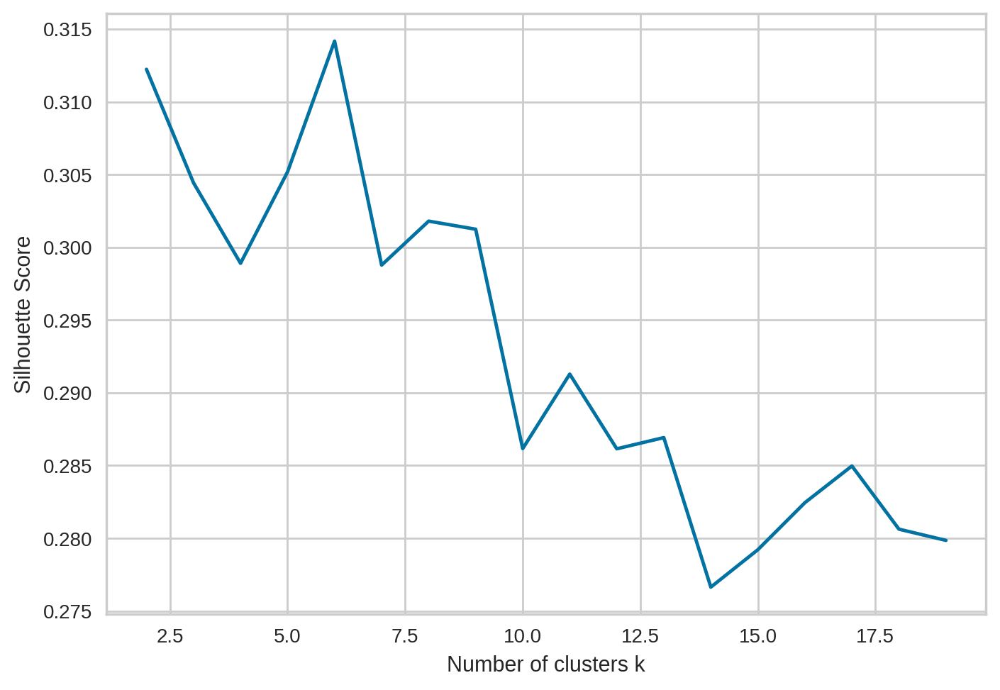

In [39]:
# Silhouette score for assessing cluster quality
from sklearn.metrics import silhouette_score
K = 20 # Maximum number of clusters to try
silhouette_scores = np.zeros(K-2)
for k in range(2, K):
    # Create a KMeans instance with k clusters
    model = KMeans(n_clusters=k, random_state=42)
    # Fit the model and predict the clusters
    model_labels = model.fit_predict(data_scaled)
    # Calculate the silhouette score and store it
    silhouette_scores[k-2] = silhouette_score(data_scaled, model_labels)
# Plot the silhouette scores for different numbers of clusters
plt.plot(range(2, K), silhouette_scores, 'b-')
plt.xlabel("Number of clusters k")
plt.ylabel("Silhouette Score")
plt.show()

/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:8

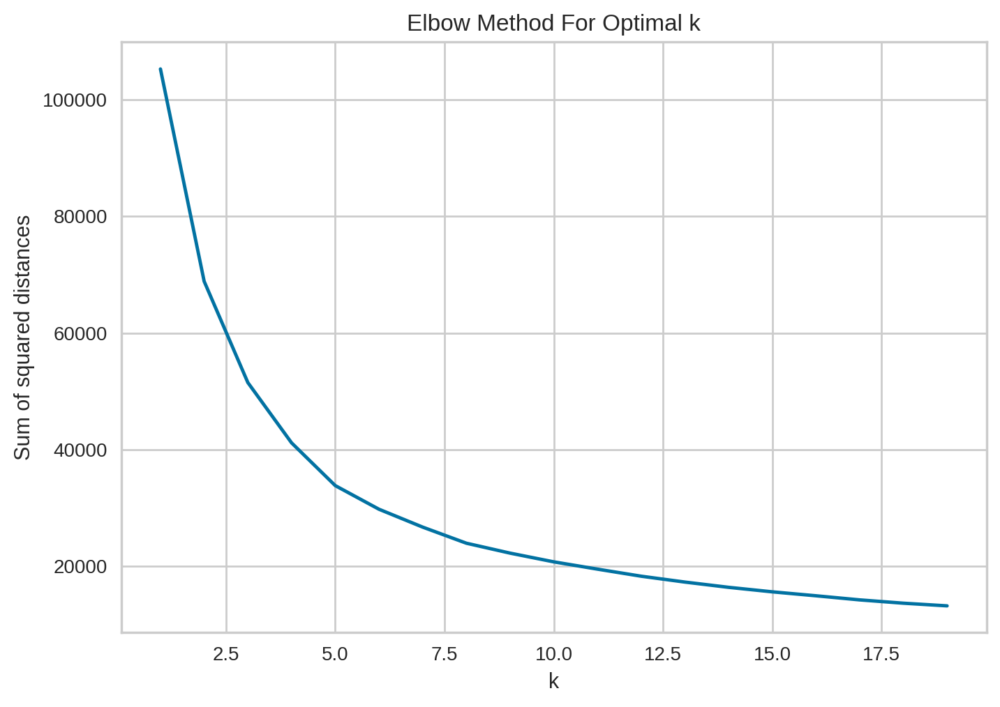

In [40]:
from sklearn.cluster import KMeans
# Intra-cluster inertia (Elbow Method)
# Initializing an empty list to store the sum of squared distances
sum_of_squared_distances = []
# Looping over a range of k values to find the optimal number
for k in range(1, K):
    # Create a KMeans instance with k clusters
    kmeans = KMeans(n_clusters=k)
    # Fit the model to the data
    kmeans.fit(data_scaled)
    # Append the model’s inertia to the list
    sum_of_squared_distances.append(kmeans.inertia_)
# Plot the elbow curve using the sum of squared distances
plt.plot(range(1, K), sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()

SilhouetteVisualizer(ax=<Axes: >, colors='yellowbrick',
                     estimator=KMeans(n_clusters=19, random_state=42))

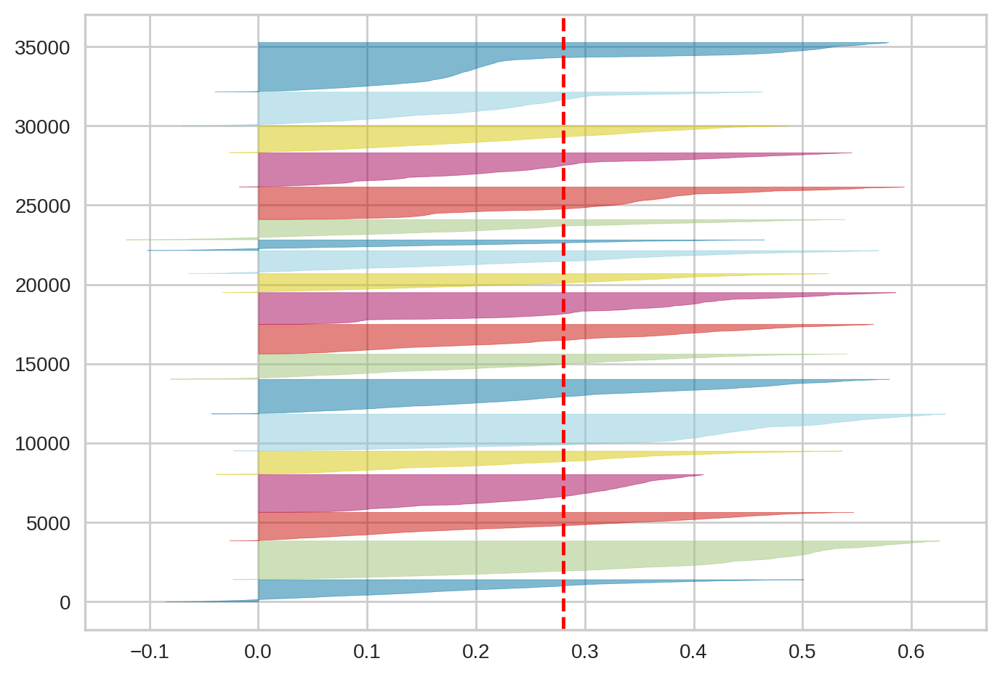

In [41]:
# Silhouette Visualizer to visualize the silhouette score
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
# Fit the data to the visualizer
visualizer.fit(data_scaled)

In [42]:
# Render the figure
visualizer.show()

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 35088 Samples in 19 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:8

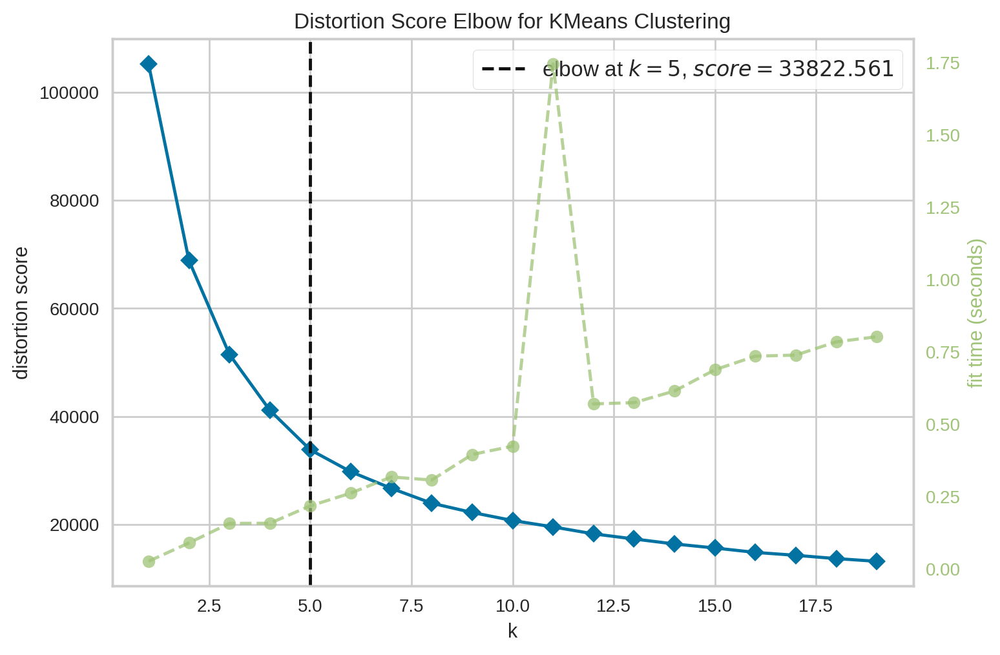

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [43]:
# KElbow Visualizer to find the elbow point
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1, 20))
# Fit the data to the visualizer
visualizer.fit(data_scaled)
# Render the figure
visualizer.show()

### K-Means Clustering - Scenario 1: K = 5


In [44]:
# Adjusting the best model based on fine-tuning results
# Instantiate the "best" model with k=5 clusters
K = 5
model = KMeans(n_clusters=K, random_state=42)
# Fit the model and predict clusters
model_labels = model.fit_predict(data_scaled)
# Calculate and print the silhouette score for the optimal number of clusters
print("Silhouette Score:", silhouette_score(data_scaled, model_labels))

/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score: 0.30518461767036265


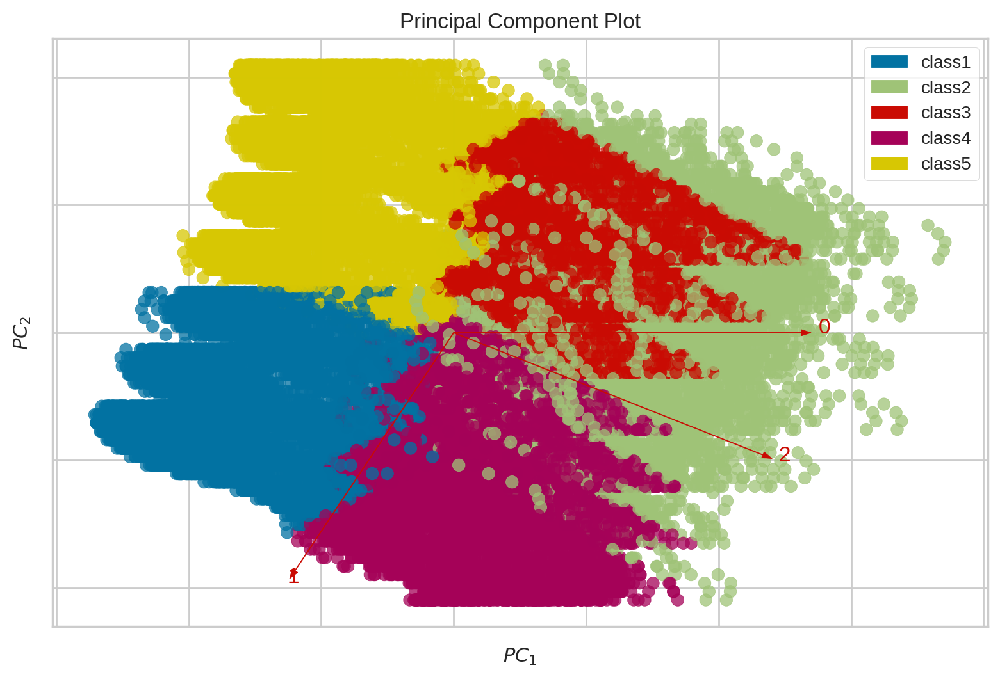

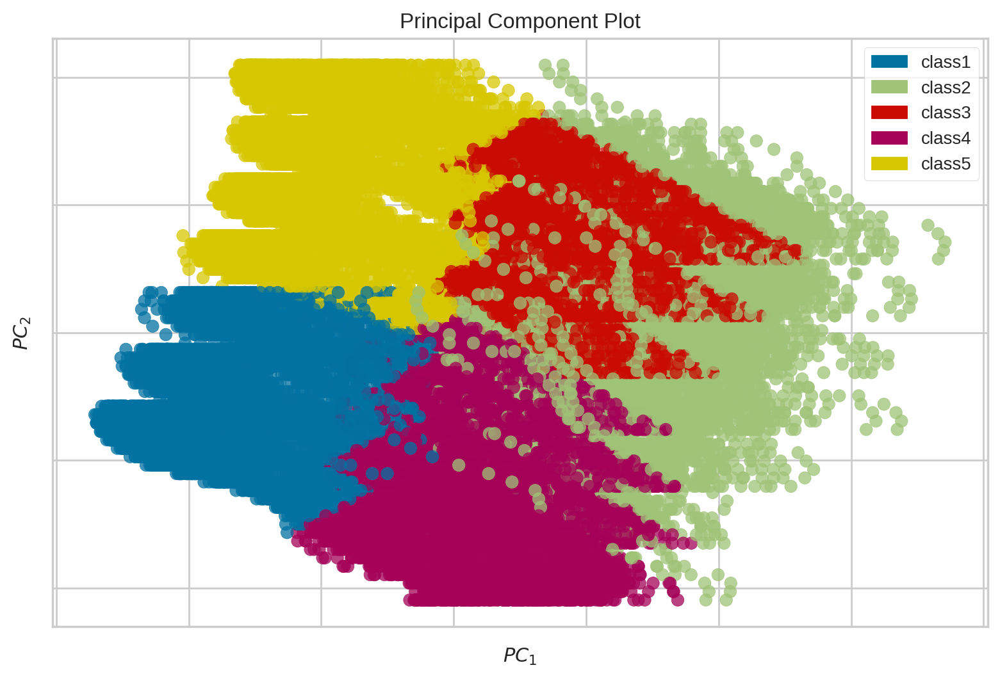

<Axes: title={'center': 'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$'>

In [45]:
from yellowbrick.features import PCA
# Visualization of the clusters in the plane
# Defining the cluster names
classes = ['cluster 1', 'cluster 2', 'cluster 3', 'cluster 4', 'cluster 5']
# Visualize the clusters with feature projection
pca_viz = PCA(scale=True, proj_features=True, classes=['class1', 'class2','class3','class4','class5'])
pca_viz.fit_transform(data_scaled,model_labels)
pca_viz.show()
# Visualize the clusters without feature projection
pca_viz = PCA(scale=True, proj_features=False, classes=['class1', 'class2','class3','class4','class5'])
pca_viz.fit_transform(data_scaled,model_labels)
pca_viz.show()

### K-Means Clustering - Scenario 2: K = 6

In [46]:
# Adjusting the best model based on fine-tuning results
# Instantiate the "best" model with k=6 clusters
K = 6
model = KMeans(n_clusters=K, random_state=42)
# Fit the model and predict clusters
model_labels = model.fit_predict(data_scaled)
# Calculate and print the silhouette score for the optimal number of clusters
print("Silhouette Score:", silhouette_score(data_scaled, model_labels))

/usr/local/lib/python3.11/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score: 0.31417057200449905


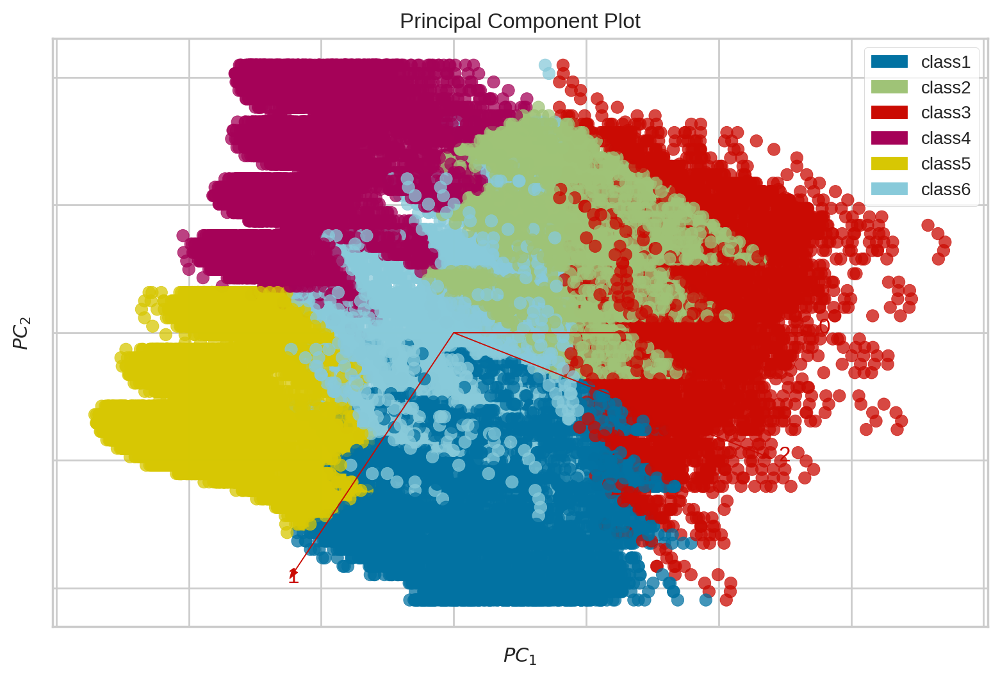

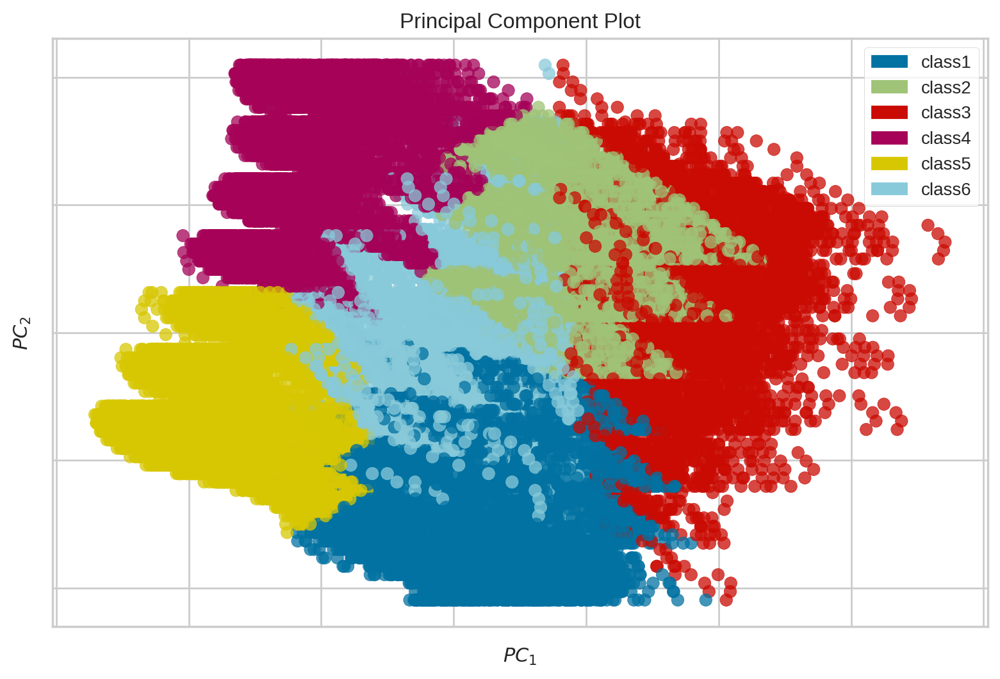

<Axes: title={'center': 'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$'>

In [47]:
from yellowbrick.features import PCA
# Visualization of the clusters in the plane
# Defining the cluster names
classes = ['cluster 1', 'cluster 2', 'cluster 3', 'cluster 4', 'cluster 5', 'cluster 6']
# Visualize the clusters with feature projection
pca_viz = PCA(scale=True, proj_features=True, classes=['class1', 'class2','class3','class4','class5','class6'])
pca_viz.fit_transform(data_scaled,model_labels)
pca_viz.show()
# Visualize the clusters without feature projection
pca_viz = PCA(scale=True, proj_features=False, classes=['class1', 'class2','class3','class4','class5','class6'])
pca_viz.fit_transform(data_scaled,model_labels)
pca_viz.show()

# K-Means Clustering Conclusion 

### Dựa trên hai biểu đồ được tạo ra từ mô hình được huấn luyện bởi K=5 và K=6, chúng ta có thể thấy rõ ràng K=6 được phân cụm tốt hơn so với K=5. Từ các tín hiệu trực quan, có vẻ như một số cụm trong biểu đồ PCA này đang chồng chéo lên nhau, điều này có thể cho thấy sự phân tách giữa các cụm không hoàn toàn rõ ràng. Tuy nhiên, biểu đồ PCA là một dạng đơn giản hóa và chỉ hiển thị một phần của bức tranh, vì chúng thường chỉ hiển thị hai chiều của một tập dữ liệu có thể đa chiều.

In [48]:
data_scaled_df = pd.DataFrame(scaler.inverse_transform(data_scaled), columns=['Energy_Consumption_MW', 'DayOfWeek', 'TimeInADay'])  # Replace with your actual feature names
data_scaled_df['Cluster'] = model_labels
data_scaled_df.index = data_clean_clustering.index

In [49]:
# Add the 'Datetime' column from the original dataset to the scaled DataFrame
data_scaled_df['Datetime'] = data_clean_clustering['Datetime']
data_scaled_df.set_index(['Datetime'])

,Energy_Consumption_MW,DayOfWeek,TimeInADay,Cluster
Datetime,,,,
2013-12-31 00:00:00,15592.0,1.0,0.0,3
2013-12-31 01:00:00,15128.0,1.0,1.0,3
2013-12-31 02:00:00,14886.0,1.0,2.0,3
2013-12-31 03:00:00,14831.0,1.0,3.0,3
2013-12-31 04:00:00,14873.0,1.0,4.0,3
...,...,...,...,...
2017-12-31 19:00:00,19608.0,6.0,19.0,2
2017-12-31 20:00:00,19442.0,6.0,20.0,0
2017-12-31 21:00:00,19323.0,6.0,21.0,0


In [50]:
mean_energy_consumption_per_cluster = data_scaled_df.groupby('Cluster')['Energy_Consumption_MW'].mean()
min_energy_consumption_per_cluster = data_scaled_df.groupby('Cluster')['Energy_Consumption_MW'].min()
max_energy_consumption_per_cluster = data_scaled_df.groupby('Cluster')['Energy_Consumption_MW'].max()

print('Mean:')
print(mean_energy_consumption_per_cluster)
print('Min:')
print(min_energy_consumption_per_cluster)
print('Max:')
print(max_energy_consumption_per_cluster)

Mean:
Cluster
0    14576.669433
1    15173.833739
2    19070.128559
3    12881.738935
4    12210.647405
5    16186.939102
Name: Energy_Consumption_MW, dtype: float64
Min:
Cluster
0    10511.0
1    12040.0
2    16466.0
3     9846.0
4     9581.0
5    12957.0
Name: Energy_Consumption_MW, dtype: float64
Max:
Cluster
0    19637.0
1    17822.0
2    24739.0
3    17511.0
4    15723.0
5    22584.0
Name: Energy_Consumption_MW, dtype: float64


# Supervised Learning - Tensorflow - LSTM/RNN

### Data Visualization

In [51]:
filtered_df.groupby('Time').size()

Time
00:00:00    1462
01:00:00    1462
02:00:00    1462
03:00:00    1462
04:00:00    1462
05:00:00    1462
06:00:00    1462
07:00:00    1462
08:00:00    1462
09:00:00    1462
10:00:00    1462
11:00:00    1462
12:00:00    1462
13:00:00    1462
14:00:00    1462
15:00:00    1462
16:00:00    1462
17:00:00    1462
18:00:00    1462
19:00:00    1462
20:00:00    1462
21:00:00    1462
22:00:00    1462
23:00:00    1462
dtype: int64

In [52]:
filtered_df.nunique()

Company                      1
Energy_Consumption_MW    10068
Datetime                 35088
Date                      1462
Time                        24
DayOfWeek                    7
dtype: int64

In [53]:
print (np.mean(filtered_df['Energy_Consumption_MW'])) # mean
print (statistics.median(filtered_df['Energy_Consumption_MW'])) # median
print (filtered_df['Energy_Consumption_MW'].var())
print (np.std(filtered_df['Energy_Consumption_MW'], ddof=1) / np.sqrt(len(filtered_df['Energy_Consumption_MW'])))

14827.81050501596
14501.0
6413791.985494529
13.520044720847638


In [54]:
np.std(filtered_df['Energy_Consumption_MW'], ddof=1) # Standard deviation - Energy Consumption

2532.546541624562

In [55]:
filtered_df

,Company,Energy_Consumption_MW,Datetime,Date,Time,DayOfWeek
1,American Electric Power Company,15592.0,2013-12-31 00:00:00,2013-12-31,00:00:00,Tuesday
2,American Electric Power Company,15128.0,2013-12-31 01:00:00,2013-12-31,01:00:00,Tuesday
3,American Electric Power Company,14886.0,2013-12-31 02:00:00,2013-12-31,02:00:00,Tuesday
4,American Electric Power Company,14831.0,2013-12-31 03:00:00,2013-12-31,03:00:00,Tuesday
5,American Electric Power Company,14873.0,2013-12-31 04:00:00,2013-12-31,04:00:00,Tuesday
...,...,...,...,...,...,...
35084,American Electric Power Company,19608.0,2017-12-31 19:00:00,2017-12-31,19:00:00,Sunday
35085,American Electric Power Company,19442.0,2017-12-31 20:00:00,2017-12-31,20:00:00,Sunday
35086,American Electric Power Company,19323.0,2017-12-31 21:00:00,2017-12-31,21:00:00,Sunday
35087,American Electric Power Company,19092.0,2017-12-31 22:00:00,2017-12-31,22:00:00,Sunday


In [56]:
filtered_df['Energy_Consumption_MW'] = pd.to_numeric(filtered_df['Energy_Consumption_MW'], errors='coerce')

### Hãy cùng xem xét kỹ hơn tập dữ liệu bằng cách tính toán mức tiêu thụ năng lượng trung bình (Energy_Consumption_MW) cho từng khoảng thời gian cụ thể trong DataFrame filtered_df. Sau đó, chúng ta sẽ sử dụng dữ liệu này để trực quan hóa mức tiêu thụ năng lượng trung bình theo từng khoảng thời gian mỗi ngày nhằm hiểu rõ xu hướng tiêu thụ năng lượng.

In [57]:
mean_all_df = filtered_df.groupby('Time')['Energy_Consumption_MW'].mean().reset_index()
mean_all_df.columns = ['Time', 'Average_Energy_Consumption_MW']
print(mean_all_df)

        Time  Average_Energy_Consumption_MW
0   00:00:00                   13940.827633
1   01:00:00                   13262.002052
2   02:00:00                   12849.571135
3   03:00:00                   12628.544460
4   04:00:00                   12558.735294
5   05:00:00                   12714.341313
6   06:00:00                   13255.496580
7   07:00:00                   14169.553352
8   08:00:00                   14796.229138
9   09:00:00                   15106.489740
10  10:00:00                   15352.757866
11  11:00:00                   15566.571135
12  12:00:00                   15672.599863
13  13:00:00                   15767.102599
14  14:00:00                   15841.422709
15  15:00:00                   15821.871409
16  16:00:00                   15796.741450
17  17:00:00                   15893.803010
18  18:00:00                   16096.860465
19  19:00:00                   16170.415869
20  20:00:00                   16102.792750
21  21:00:00                   1

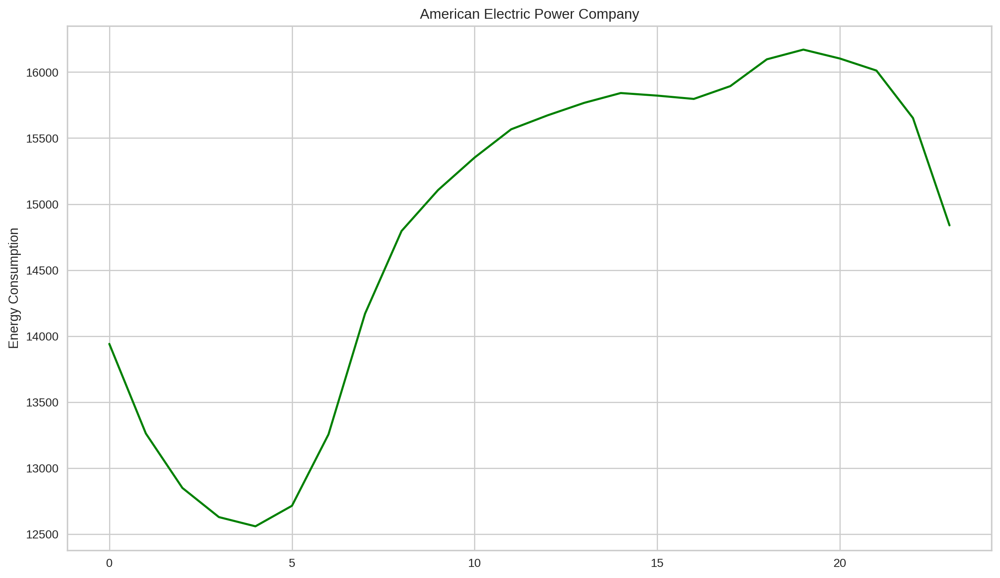

In [58]:
# Energy Consumption - Day Time
plt.figure(figsize=(14,8))
mean_all_df['Average_Energy_Consumption_MW'].plot(color='green')
plt.ylabel('Energy Consumption')
plt.title('American Electric Power Company')
plt.show()

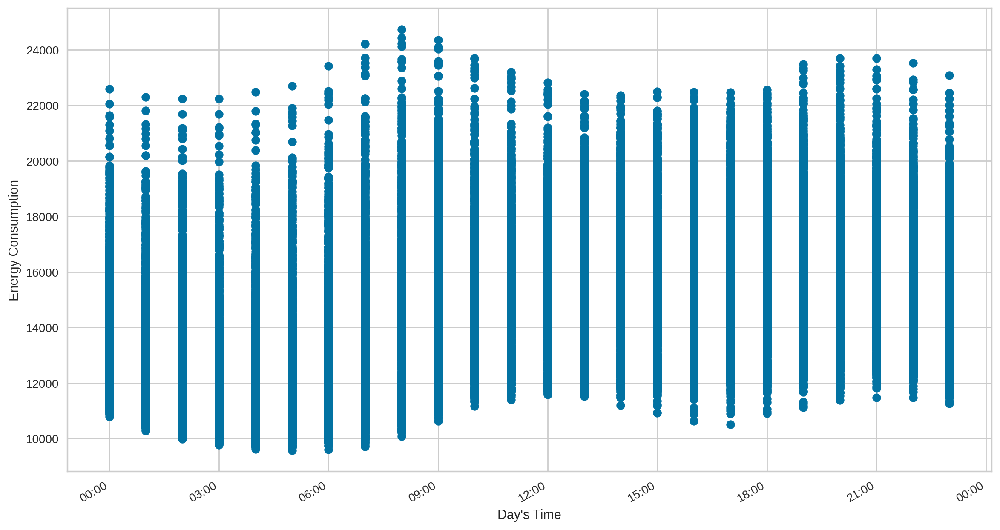

In [59]:
# Energy Consumption - Day Time - AEP
plt.figure(figsize=(14,8))
plt.plot([],[])
rate = filtered_df['Energy_Consumption_MW']
time=pd.to_datetime(filtered_df['Time'], format='%H:%M:%S')
plt.scatter(time,rate)
plt.gcf().autofmt_xdate()
myFmt = mdates.DateFormatter('%H:%M')
plt.gca().xaxis.set_major_formatter(myFmt)
plt.xlabel("Day's Time")
plt.ylabel('Energy Consumption')
plt.show()

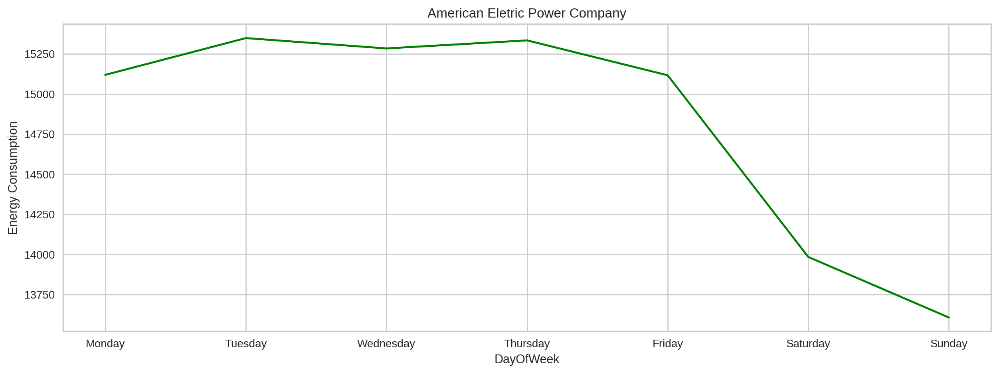

           Average_Energy_Consumption_MW
DayOfWeek                               
Monday                      15119.812099
Tuesday                     15349.035885
Wednesday                   15284.610048
Thursday                    15334.783692
Friday                      15117.307416
Saturday                    13984.103070
Sunday                      13606.418461


In [60]:
plt.figure(figsize=(15,5))
dowmean = filtered_df.groupby('DayOfWeek')['Energy_Consumption_MW'].mean().reset_index()
dowmean.columns = ['DayOfWeek', 'Average_Energy_Consumption_MW']
day_order = {'Monday': 0,'Tuesday': 1,'Wednesday': 2,'Thursday': 3,'Friday': 4,'Saturday': 5,'Sunday': 6}
dowmean['DayOrder'] = dowmean['DayOfWeek'].map(day_order)
dowmean_sorted = dowmean.sort_values('DayOrder')
dowmean_sorted = dowmean_sorted.drop('DayOrder', axis=1)
dowmean_sorted = dowmean_sorted.reset_index(drop=True)
dowmean_sorted = dowmean_sorted.set_index(['DayOfWeek'])
dowmean_sorted['Average_Energy_Consumption_MW'].plot(color='green')
plt.ylabel('Energy Consumption')
plt.title('American Eletric Power Company')
plt.show()
print(dowmean_sorted)

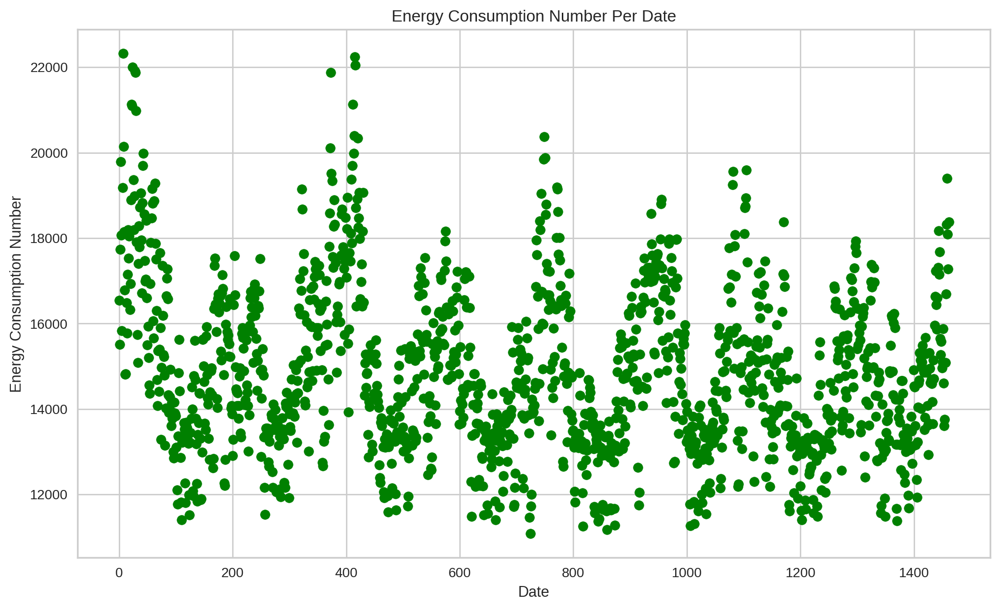

In [61]:
plt.figure(figsize=(12,7))
filtered_df['Date'] = filtered_df.Datetime.dt.date
date_x = filtered_df.groupby('Date')['Energy_Consumption_MW'].mean().reset_index()
date_x.columns = ['Date', 'Average_Energy_Consumption_MW']
plt.scatter(date_x.index, date_x['Average_Energy_Consumption_MW'], color = 'green')
plt.ylabel('Energy Consumption Number')
plt.xlabel('Date')
plt.title('Energy Consumption Number Per Date')
plt.show()

In [62]:
filtered_df = filtered_df[['Datetime', 'Energy_Consumption_MW']]

In [63]:
filtered_dfx = filtered_df.set_index('Datetime')

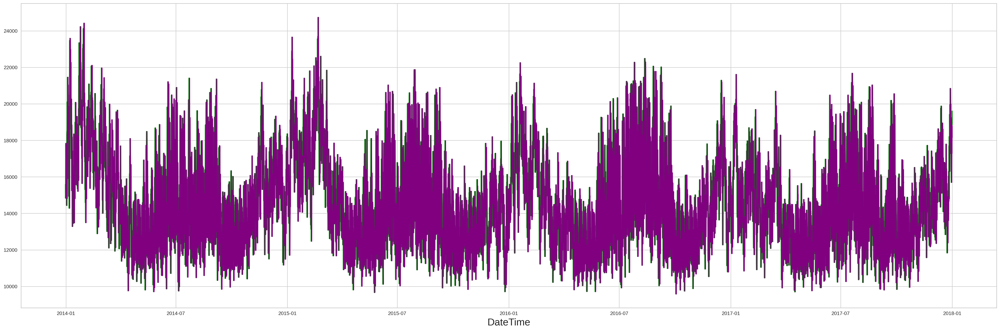

In [64]:
plt.figure(figsize=(35,11))
plt.plot(filtered_dfx, color='green')
plt.plot(filtered_dfx.shift(24), color='purple')
plt.xlabel('DateTime', fontsize=20);

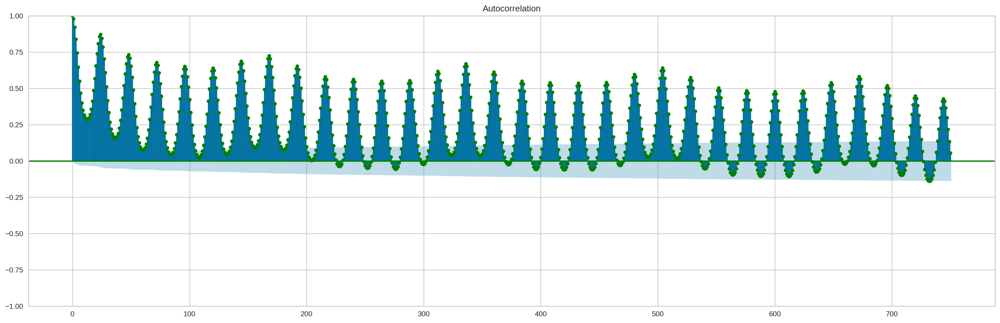

In [65]:
def subplots_acf(series):
    fig1 = plt.figure(figsize=(24,16))
    ax1 = fig1.add_subplot(211)
    fig1 = plot_acf(series, lags=750, ax=ax1, color='green')
    plt.show()

subplots_acf(filtered_dfx)

### Train and Test Data Separation


In [66]:
from sklearn.preprocessing import MinMaxScaler
import joblib

# Check for NaN values in the original DataFrame
print("NaNs in original data:", filtered_dfx.isna().any())

# Scaling
scaler = MinMaxScaler()
scaler_data = scaler.fit_transform(filtered_dfx)
#scaler_data = scaler_data[:, 0]  # Assuming filtered_dfx has only one column

# Lưu scaler ngay tại đây
import joblib
joblib.dump(scaler, "scaler.pkl")

# Check for NaNs after scaling
print("NaNs after scaling:", np.isnan(scaler_data).any())

# Create DataFrame
index = np.arange(0, len(scaler_data), 1)
scaler_df = pd.DataFrame(scaler_data, index=index, columns=['Energy_Consumption_MW'])

# Splitting the data
train_size = int(len(scaler_df) * 0.8)
train, test = scaler_df.iloc[0:train_size], scaler_df.iloc[train_size:len(scaler_df)]

print("Train size:", len(train), "Test size:", len(test))

NaNs in original data: Energy_Consumption_MW    False
dtype: bool
NaNs after scaling: False
Train size: 28070 Test size: 7018


In [67]:
train

,Energy_Consumption_MW
0,0.396556
1,0.365945
2,0.349980
3,0.346352
4,0.349123
...,...
28065,0.564388
28066,0.563861
28067,0.565510
28068,0.561750


In [68]:
test

,Energy_Consumption_MW
28070,0.545652
28071,0.536087
28072,0.520385
28073,0.521507
28074,0.546048
...,...
35083,0.661499
35084,0.650548
35085,0.642697
35086,0.627457


### Hàm create_dataset được thiết kế để chuẩn bị dữ liệu đầu vào cho mô hình học có giám sát dùng trong dự báo chuỗi thời gian. Hàm này lấy một chuỗi các điểm dữ liệu (X), các nhãn tương ứng (y) và một tham số time_steps xác định độ dài của chuỗi đầu vào cho mỗi mẫu. Hàm này tạo ra các chuỗi dữ liệu (Xs), trong đó mỗi chuỗi bao gồm các giá trị time_steps liên tiếp từ tập dữ liệu gốc. Các nhãn tương ứng (ys) là các giá trị tại bước thời gian tiếp theo. Thao tác này sẽ tái cấu trúc dữ liệu thành định dạng phù hợp để huấn luyện các mô hình chuỗi thời gian, trong đó mục tiêu là dự đoán giá trị tiếp theo trong chuỗi.

### Các biến X_train và y_train sau đó được tạo bằng cách áp dụng hàm này vào tập huấn luyện với số bước thời gian được chỉ định (trong trường hợp này là 24, có thể đại diện cho 24 giờ cho dự báo hàng ngày). Tương tự, X_test và y_test được chuẩn bị từ tập kiểm tra. Hình dạng của các mảng kết quả được in ra, hiển thị số lượng mẫu và cấu trúc của đầu vào và đầu ra sẽ được sử dụng để huấn luyện và đánh giá mô hình. Quá trình này là chìa khóa cho các mô hình như LSTM, yêu cầu dữ liệu đầu vào dưới dạng chuỗi để dự đoán dữ liệu theo thời gian.

In [69]:
def create_dataset(X, y, time_steps=1):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        v = X.iloc[i:(i + time_steps)].values
        Xs.append(v)        
        ys.append(y.iloc[i + time_steps])
    return np.array(Xs), np.array(ys)

# Define the time steps
n_steps = 24

# Prepare training data
X_train, y_train = create_dataset(train, train['Energy_Consumption_MW'], n_steps)

# Prepare test data
X_test, y_test = create_dataset(test, test['Energy_Consumption_MW'], n_steps)

print("Training data shape:", X_train.shape, y_train.shape)
print("Test data shape:", X_test.shape, y_test.shape)

Training data shape: (28046, 24, 1) (28046,)
Test data shape: (6994, 24, 1) (6994,)


# Time-series Model Training and Forecasting

### LSTM

In [70]:
!pip install wandb


In [71]:

import wandb
wandb.login(key="bc144091effe26789524d4b4ebf792d7fbdda92c")

import wandb
# from wandb.keras import WandbCallback
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow import keras

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: boobyyy03 (boobyyy03-fpt-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


In [72]:
import wandb
# from wandb.keras import WandbCallback
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow import keras


# Init wandb
wandb.init(
    project="lstm_forecasting_final",
    name="LSTM_logging",
    config={
        "epochs": 100,
        "batch_size": 24,
        "optimizer": "adam",
        "learning_rate": 0.001,
        "loss": "mean_squared_error",
        "dropout": 0.2,
        "lstm_units": [128, 64]
    }
)

class CustomWandbCallback(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if logs:
            wandb.log(logs, step=epoch)


# Model architecture
lstm_model = keras.Sequential([
    LSTM(units=128, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True),
    Dropout(0.2),
    LSTM(units=64),
    Dropout(0.2),
    Dense(units=1)
])

# Compile the model
lstm_model.compile(
    loss='mean_squared_error',
    optimizer=keras.optimizers.Adam(0.001)
)

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_lstm_model.h5', monitor='val_loss', save_best_only=True)
custom_wandb_callback = CustomWandbCallback()

# Model Training
history = lstm_model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=24,
    validation_split=0.1,
    verbose=1,
    shuffle=False,
    callbacks=[
        early_stopping,
        model_checkpoint,
        custom_wandb_callback  # Dùng custom thay cho WandbCallback()
    ]
)



I0000 00:00:1753132049.461756      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100


I0000 00:00:1753132054.259724    1284 cuda_dnn.cc:529] Loaded cuDNN version 90300


1052/1052 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - loss: 0.0151 - val_loss: 0.0018
Epoch 2/100
1052/1052 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 0.0025 - val_loss: 8.6349e-04
Epoch 3/100
1052/1052 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 0.0015 - val_loss: 5.5450e-04
Epoch 4/100
1052/1052 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 0.0011 - val_loss: 4.5738e-04
Epoch 5/100
1052/1052 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 9.0378e-04 - val_loss: 3.3476e-04
Epoch 6/100
1052/1052 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 7.6463e-04 - val_loss: 3.5489e-04
Epoch 7/100
1052/1052 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 6.8923e-04 - val_loss: 3.7061e-04
Epoch 8/100
1052/1052 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 6.6568e-04 - val_loss: 3.9120e-04
Epoch 9/100
1052/1052 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 6.6016e-04 - val_loss: 3.4339e-04
Epoch 10/100
1052/1052 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 6.2320e-04 - val_loss: 3.3751e-04
Epoch 11/100
1052/1052 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - lo

In [73]:
# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_lstm_model.h5', monitor='val_loss', save_best_only=True)

In [74]:
lstm_pred = lstm_model.predict(X_test)
df_lstm_final = test[lstm_pred.shape[0]*-1:].copy()
df_lstm_final['Prediction'] = lstm_pred[:,0]
df_reset_index = filtered_df.reset_index()
df_lstm_final['Date'] = df_reset_index['Datetime']
df_lstm_final = df_lstm_final.set_index(["Date"], drop=True)

219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [75]:
df_lstm_final['Energy_Consumption_MW'] = scaler.inverse_transform(df_lstm_final['Energy_Consumption_MW'].to_numpy().reshape(-1, 1))
df_lstm_final['Prediction'] = scaler.inverse_transform(df_lstm_final['Prediction'].to_numpy().reshape(-1, 1))

In [76]:
df_lstm_final

,Energy_Consumption_MW,Prediction
Date,,
2017-03-15 14:00:00,18398.0,18367.228516
2017-03-15 15:00:00,17979.0,17976.105469
2017-03-15 16:00:00,17569.0,17582.398438
2017-03-15 17:00:00,17445.0,17251.236328
2017-03-15 18:00:00,17545.0,17449.169922
...,...,...
2017-12-31 19:00:00,19608.0,19807.322266
2017-12-31 20:00:00,19442.0,19599.744141
2017-12-31 21:00:00,19323.0,19254.541016


In [77]:
train2 = train.copy()
train2.index = filtered_df.index[:len(train)]
train2['Energy_Consumption_MW'] = scaler.inverse_transform(train2['Energy_Consumption_MW'].to_numpy().reshape(-1, 1))
train2['Datetime'] = filtered_df['Datetime']
train2 = train2.set_index(['Datetime'])

In [78]:
def report_metrics(y_true, y_pred):
    print("Explained Variance:\n\t", metrics.explained_variance_score(y_true, y_pred))
    print("MAE:\n\t", metrics.mean_absolute_error(y_true, y_pred))
    print("RMSE:\n\t", np.sqrt(metrics.mean_squared_error(y_true, y_pred)))

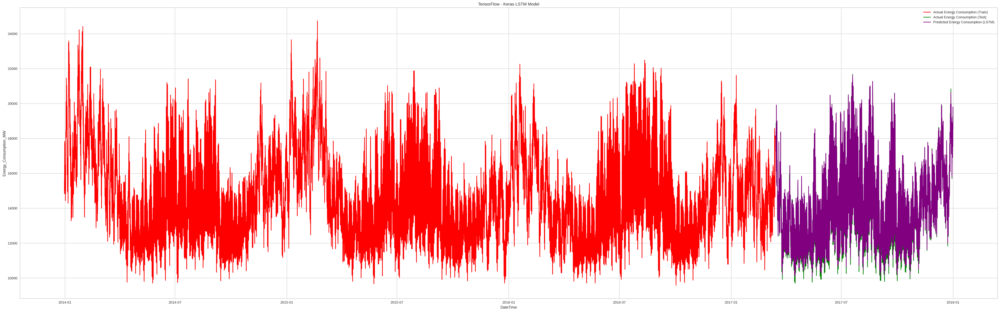

Explained Variance:
	 0.9901437068078263
MAE:
	 194.18413592789355
RMSE:
	 243.27580264455455


In [79]:
plt.figure(figsize=(50,15))
plt.title('TensorFlow - Keras LSTM Model')
plt.plot(train2, color='red', label='Actual Energy Consumption (Train)')
plt.xlabel('DateTime')
plt.ylabel('Energy_Consumption_MW')
plt.plot(df_lstm_final['Energy_Consumption_MW'], color='green', label='Actual Energy Consumption (Test)')
plt.plot(df_lstm_final['Prediction'], color='purple', label='Predicted Energy Consumption (LSTM)')
plt.legend()

plt.show()

report_metrics(df_lstm_final['Energy_Consumption_MW'].squeeze(), df_lstm_final['Prediction'].squeeze())

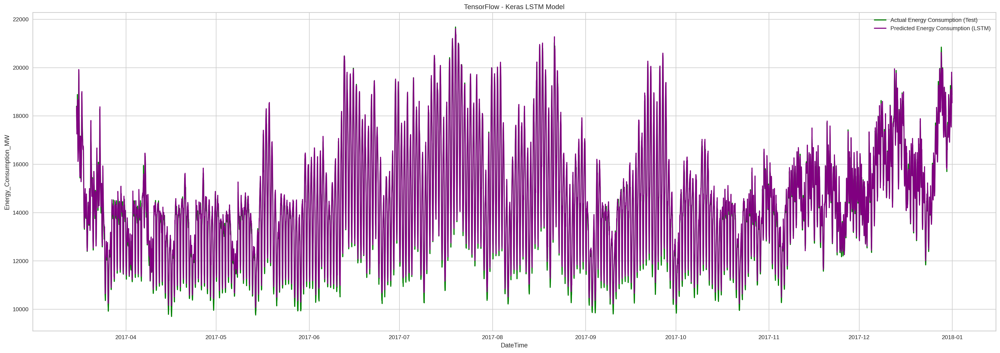

Explained Variance:
	 0.9901437068078263
MAE:
	 194.18413592789355
RMSE:
	 243.27580264455455


In [80]:
plt.figure(figsize=(30,10))
plt.title('TensorFlow - Keras LSTM Model')
plt.xlabel('DateTime')
plt.ylabel('Energy_Consumption_MW')
plt.plot(df_lstm_final['Energy_Consumption_MW'], color='green', label='Actual Energy Consumption (Test)')
plt.plot(df_lstm_final['Prediction'], color='purple', label='Predicted Energy Consumption (LSTM)')
plt.legend()

plt.show()

report_metrics(df_lstm_final['Energy_Consumption_MW'].squeeze(), df_lstm_final['Prediction'].squeeze())

# TRANSFORMER

---------------------


In [84]:
import tensorflow as tf
from tensorflow.keras.layers import (
    MultiHeadAttention, LayerNormalization,
    Dense, Dropout, GlobalAveragePooling1D, Input, Embedding
)
from tensorflow.keras.models import Model

# ======= Positional Embedding =======
class PositionalEmbedding(tf.keras.layers.Layer):
    def __init__(self, sequence_length, embed_dim):
        super().__init__()
        self.token_projection = Dense(embed_dim)
        self.position_embedding = Embedding(input_dim=sequence_length, output_dim=embed_dim)

    def call(self, inputs):
        # inputs shape: (batch, seq_len, features)
        seq_len = tf.shape(inputs)[1]
        positions = tf.range(start=0, limit=seq_len, delta=1)  # (seq_len,)
        positions = self.position_embedding(positions)         # (seq_len, embed_dim)
        positions = tf.expand_dims(positions, 0)               # (1, seq_len, embed_dim)
        embedded_tokens = self.token_projection(inputs)        # (batch, seq_len, embed_dim)
        return embedded_tokens + positions                     # (batch, seq_len, embed_dim)

# ======= Transformer Block =======
class TransformerBlock(tf.keras.layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super().__init__()
        self.att = MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = tf.keras.Sequential([
            Dense(ff_dim, activation="relu"),
            Dense(embed_dim),
        ])
        self.layernorm1 = LayerNormalization(epsilon=1e-6)
        self.layernorm2 = LayerNormalization(epsilon=1e-6)
        self.dropout1 = Dropout(rate)
        self.dropout2 = Dropout(rate)

    def call(self, inputs, training=None):
        attn_output = self.att(inputs, inputs)                 # (batch, seq, embed_dim)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)

# ======= Hàm tạo model =======
def create_transformer_model(
    input_shape,
    embed_dim=64,
    num_heads=4,
    ff_dim=128,
    num_transformer_blocks=2,
    mlp_units=[64, 32],
    dropout_rate=0.1
):
    inputs = Input(shape=input_shape)  # (time_steps, features)

    # Thêm positional embedding
    x = PositionalEmbedding(sequence_length=input_shape[0], embed_dim=embed_dim)(inputs)

    # Nhiều block transformer
    for _ in range(num_transformer_blocks):
        x = TransformerBlock(embed_dim, num_heads, ff_dim, rate=dropout_rate)(x)

    # Pooling
    x = GlobalAveragePooling1D()(x)

    # MLP head
    for units in mlp_units:
        x = Dense(units, activation="relu")(x)
        x = Dropout(dropout_rate)(x)

    outputs = Dense(1)(x)  # Output 1 giá trị (regression)
    model = Model(inputs, outputs)
    return model


In [88]:
model = create_transformer_model(input_shape=(24, 1))
model.compile(optimizer='adam', loss='mse', metrics=['mae'])
model.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 24, 1)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ positional_embedding            │ (None, 24, 64)         │         1,664 │
│ (PositionalEmbedding)           │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ transformer_block               │ (None, 24, 64)         │        83,200 │
│ (TransformerBlock)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ transformer_block_1             │ (None, 24, 64)         │        83,200 │
│ (TransformerBlock)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d        │ (None, 64)             │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 174,337 (681.00 KB)

 Trainable params: 174,337 (681.00 KB)

 Non-trainable params: 0 (0.00 B)

In [106]:
trans_pred = model.predict(X_test)
df_trans_final = test[trans_pred.shape[0]*-1:].copy()
df_trans_final['Prediction'] = trans_pred[:,0]
df_reset_index = filtered_df.reset_index()
df_trans_final['Date'] = df_reset_index['Datetime']
df_trans_final = df_trans_final.set_index(["Date"], drop=True)

219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [107]:
df_trans_final['Energy_Consumption_MW'] = scaler.inverse_transform(df_trans_final['Energy_Consumption_MW'].to_numpy().reshape(-1, 1))
df_trans_final['Prediction'] = scaler.inverse_transform(df_trans_final['Prediction'].to_numpy().reshape(-1, 1))

In [108]:
df_trans_final

,Energy_Consumption_MW,Prediction
Date,,
2017-03-15 14:00:00,18398.0,18515.468750
2017-03-15 15:00:00,17979.0,18105.873047
2017-03-15 16:00:00,17569.0,17780.802734
2017-03-15 17:00:00,17445.0,17506.429688
2017-03-15 18:00:00,17545.0,17558.070312
...,...,...
2017-12-31 19:00:00,19608.0,19952.097656
2017-12-31 20:00:00,19442.0,19814.443359
2017-12-31 21:00:00,19323.0,19253.859375


In [109]:
train_trans = train.copy()
train_trans.index = filtered_df.index[:len(train)]
train_trans['Energy_Consumption_MW'] = scaler.inverse_transform(train_trans['Energy_Consumption_MW'].to_numpy().reshape(-1, 1))
train_trans['Datetime'] = filtered_df['Datetime']
train_trans = train_trans.set_index(['Datetime'])

In [110]:
def report_metrics(y_true, y_pred):
    print("Explained Variance:\n\t", metrics.explained_variance_score(y_true, y_pred))
    print("MAE:\n\t", metrics.mean_absolute_error(y_true, y_pred))
    print("RMSE:\n\t", np.sqrt(metrics.mean_squared_error(y_true, y_pred)))

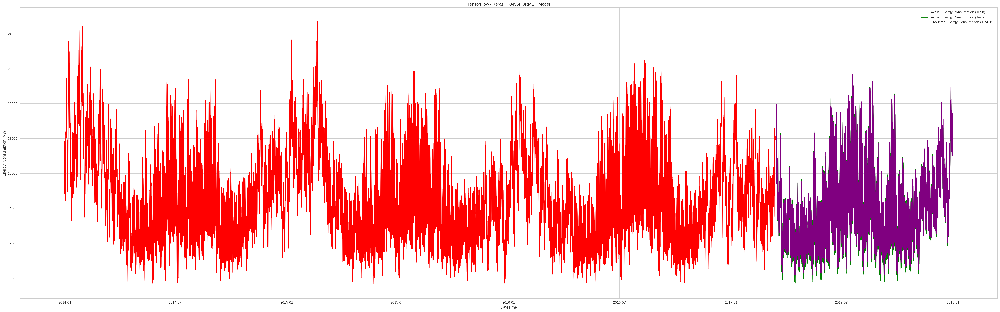

Explained Variance:
	 0.9940299387414908
MAE:
	 142.7123534737364
RMSE:
	 182.53100572393402


In [111]:
plt.figure(figsize=(50,15))
plt.title('TensorFlow - Keras TRANSFORMER Model')
plt.plot(train_trans, color='red', label='Actual Energy Consumption (Train)')
plt.xlabel('DateTime')
plt.ylabel('Energy_Consumption_MW')
plt.plot(df_trans_final['Energy_Consumption_MW'], color='green', label='Actual Energy Consumption (Test)')
plt.plot(df_trans_final['Prediction'], color='purple', label='Predicted Energy Consumption (TRANS)')
plt.legend()

plt.show()

report_metrics(df_trans_final['Energy_Consumption_MW'].squeeze(), df_trans_final['Prediction'].squeeze())

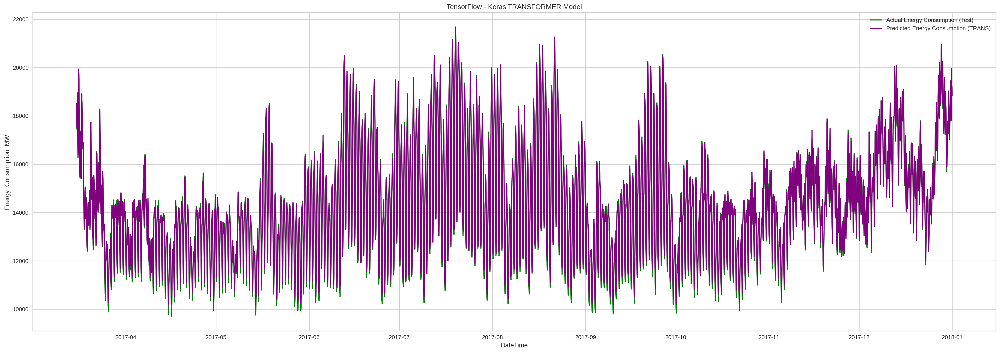

Explained Variance:
	 0.9940299387414908
MAE:
	 142.7123534737364
RMSE:
	 182.53100572393402


In [112]:
plt.figure(figsize=(30,10))
plt.title('TensorFlow - Keras TRANSFORMER Model')
plt.xlabel('DateTime')
plt.ylabel('Energy_Consumption_MW')
plt.plot(df_trans_final['Energy_Consumption_MW'], color='green', label='Actual Energy Consumption (Test)')
plt.plot(df_trans_final['Prediction'], color='purple', label='Predicted Energy Consumption (TRANS)')
plt.legend()

plt.show()

report_metrics(df_trans_final['Energy_Consumption_MW'].squeeze(), df_trans_final['Prediction'].squeeze())